**Install All the Required Packages**

In [1]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 974.5/974.5 kB 17.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 78.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 65.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 44.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 94.9 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstall

**Import All the Required Libraries**

In [2]:
from ultralytics import YOLO

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [3]:
from IPython.display import Image

**Load the YOLOv12 Model**

In [4]:
model = YOLO("yolo12x.pt")

100%|██████████| 114M/114M [00:02<00:00, 59.1MB/s]


**Download Sample Image and Video**

In [5]:
!gdown "https://drive.google.com/uc?id=1Xa1EJO_Uwv-qr0i72VK2TaQALz7X0EP1&confirm=t"

Downloading...
From: https://drive.google.com/uc?id=1Xa1EJO_Uwv-qr0i72VK2TaQALz7X0EP1&confirm=t
To: /content/image.jpg
100% 214k/214k [00:00<00:00, 132MB/s]


In [6]:
!gdown "https://drive.google.com/uc?id=1l65gM2eQMhutLP9jpySZfaQIAB_OqO2j&confirm=t"

Downloading...
From: https://drive.google.com/uc?id=1l65gM2eQMhutLP9jpySZfaQIAB_OqO2j&confirm=t
To: /content/video.mp4
100% 3.14M/3.14M [00:00<00:00, 42.5MB/s]


**Object Detection in Images using YOLOv12**

In [7]:
result = model.predict(source = "image.jpg")


image 1/1 /content/image.jpg: 448x640 13 persons, 1 bicycle, 1 bus, 2 traffic lights, 1 backpack, 4 handbags, 94.3ms
Speed: 15.6ms preprocess, 94.3ms inference, 406.4ms postprocess per image at shape (1, 3, 448, 640)


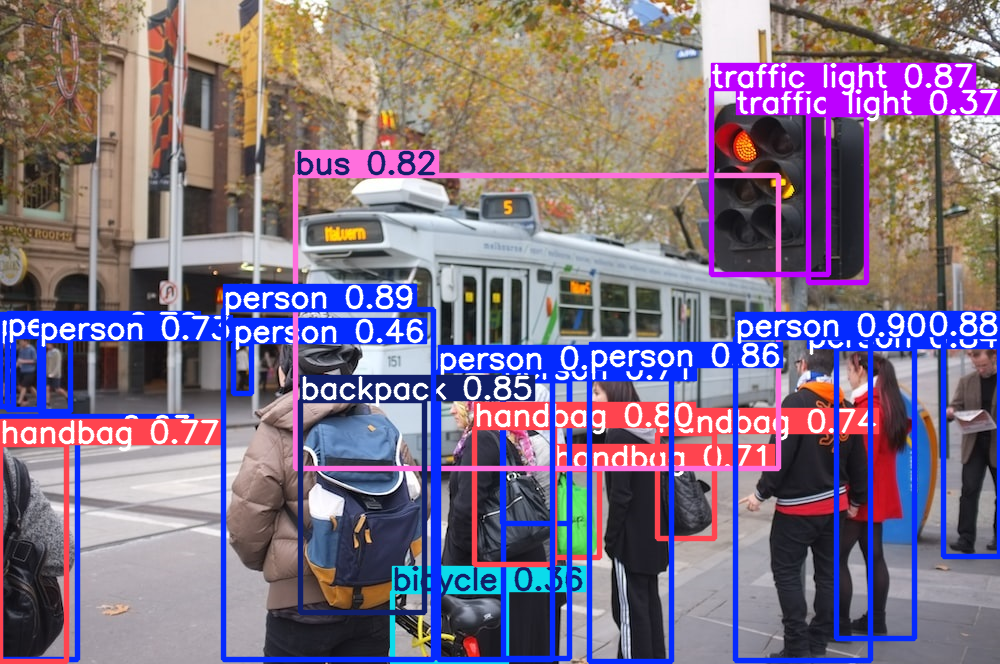

In [8]:
result[0].show()

**Save the Model Predictions**

In [9]:
result = model.predict(source = "image.jpg", save=True)


image 1/1 /content/image.jpg: 448x640 13 persons, 1 bicycle, 1 bus, 2 traffic lights, 1 backpack, 4 handbags, 66.4ms
Speed: 3.4ms preprocess, 66.4ms inference, 1.6ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict


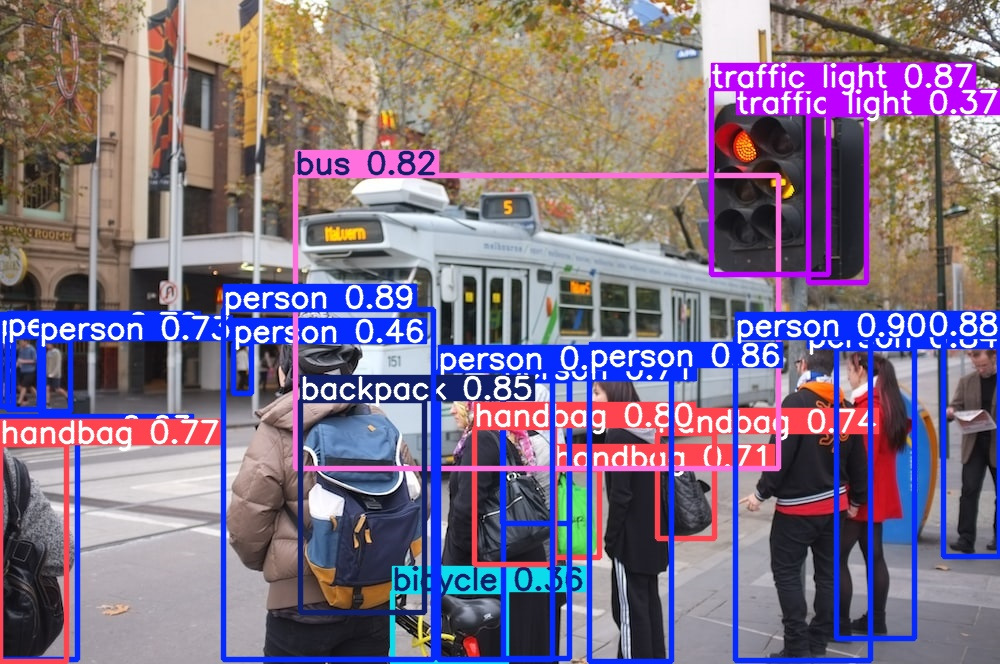

In [10]:
Image("/content/runs/detect/predict/image.jpg", width=500)

**Model Predictions on Specific Classes**

In [11]:
result = model.predict(source = "image.jpg", classes = [0,1], save=True) # If you want to detect person and bicycle


image 1/1 /content/image.jpg: 448x640 13 persons, 1 bicycle, 66.4ms
Speed: 3.3ms preprocess, 66.4ms inference, 38.6ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict


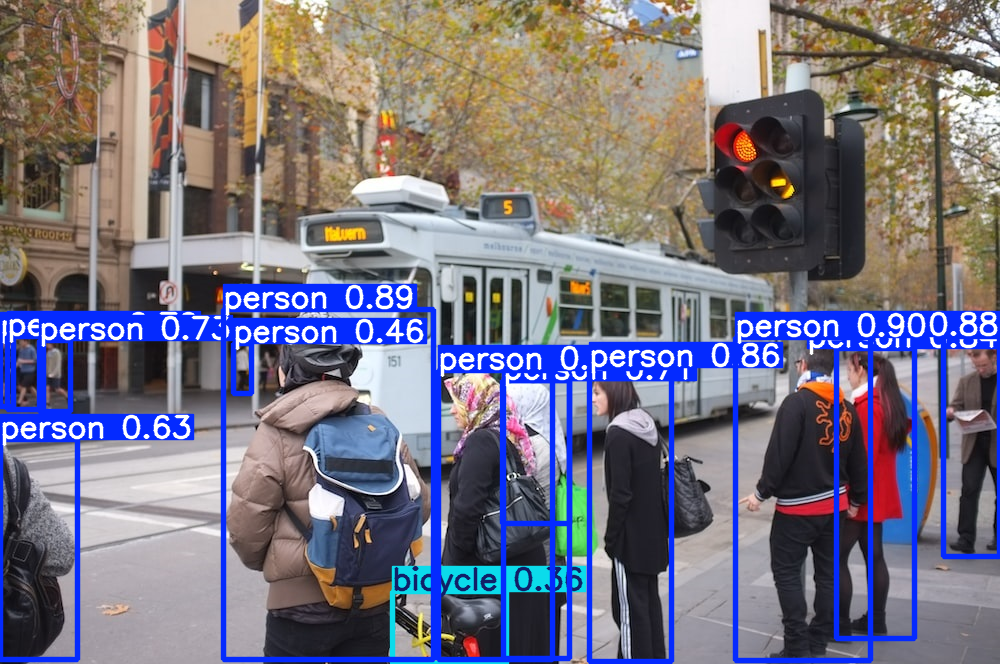

In [12]:
result[0].show()

**Object Detection in Videos using YOLOv12**

In [13]:
model = YOLO("yolo12x.pt") # Load the model again

In [14]:
results = model.predict(source = "video.mp4", save = True)



WARNING ⚠️ inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/458) /content/video.mp4: 384x640 11 persons, 10 bicycles, 2 traffic lights, 2 backpacks, 67.9ms
video 1/1 (frame 2/458) /content/video.mp4: 384x640 12 persons, 10 bicycles, 1 traffic light, 3 backpacks, 54.4ms
video 1/1 (frame 3/458) /content/video.mp4: 384x640 12 persons, 10 bicycles, 1 traffic light, 4 backpacks, 44.2ms
video 1/1 (frame 4/458) /content/video.mp4: 384x640 12 persons, 11 bicycles, 1 traffic light, 2 backpacks, 43.1ms

**Display the Output Video**

In [20]:
!rm /content/result_compressed.mp4

In [21]:
from IPython.display import HTML
from base64 import b64encode
import os

# Input video path
save_path = '/content/runs/detect/predict2/video.avi'

# Compressed video path
compressed_path = "/content/result_compressed.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)